## Avis Restau : improve the AI product of your start-up
### Context
"Avis Restau" is a start-up who's goal is to connect restaurants and customers. Customers will be able to post photos and reviews of the restaurants they have visited.

The goal here is to identify topics of bad customer reviews

### Load project modules

We will use the Python programming language, and present here the code and results in this Notebook JupyterLab file.

We will use the usual libraries for data exploration, modeling and visualisation :

* NumPy and Pandas : for maths (stats, algebra, ...) and large data manipulation
* scikit-learn : for machine learning models training and evaluation
* Plotly : for interactive data visualization

We will also use libraries specific to the goals of this project :

* NLP Natural Language Processing
    - NLTK and Spacy : for text processing
    - Gensim and pyLDAvis : for topic modelling and visualisation

### Steps that constitute the pre-processing of the text: 
- Recovery of the corpus, 
- tokenization 
- first visualization of the different frequencies.

In [1]:
# Import custom helper libraries
import os
import sys

src_path = os.path.abspath(os.path.join("../src"))
if src_path not in sys.path:
    sys.path.append(src_path)

# Load environment variables from .env file
from dotenv import load_dotenv
load_dotenv()
YELP_CLIENT_ID = os.getenv("YELP_CLIENT_ID")
YELP_API_KEY = os.getenv("YELP_API_KEY")

# Set up logging
import logging
logging.basicConfig(level=logging.WARNING)
logger = logging.getLogger(__name__)

# System modules
import random
import contractions
import re
import time
from collections import Counter
from unidecode import unidecode

# ML modules
import pandas as pd
import numpy as np
from tqdm import tqdm
tqdm.pandas()

# Viz modules
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as pyo
import plotly.graph_objs as go

# Set notebook mode to work in offline
pyo.init_notebook_mode()

# NLTK modules
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer


# sentiment analysis
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# wordcloud viz
from wordcloud import WordCloud
from wordcloud import STOPWORDS

# sklearn modules
from sklearn.feature_extraction.text  import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn import manifold#, decomposition
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn import cluster, metrics
from sklearn.manifold import TSNE
from yellowbrick.cluster.elbow import kelbow_visualizer

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from gensim.models.ldamodel import LdaModel
from gensim.models.word2vec import Word2Vec
from gensim.models import FastText

# bokeh module
from bokeh.io import output_notebook
from bokeh.plotting import figure, output_file, show
# from bokeh.models import Labela
from sklearn.manifold import TSNE

# pyLDA viz
import pyLDAvis
import pyLDAvis.gensim_models
# import pyLDAvis.gensim
from gensim.models.fasttext import FastText

# Sample data for development
TEXT_SAMPLE_SIZE = 10 * 2000  # <= 0 for all
PHOTO_SAMPLE_SIZE = 10 * 2000  # <= 0 for all

import plotly.io as pio

pio.renderers.default = "notebook"

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


C:\Users\ezequ\miniconda3\lib\site-packages\past\builtins\misc.py:45: DeprecationWarning:

the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses



### Load the dataset from CSV

In [2]:
df = pd.read_json (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\yelp_academic_dataset_business.json', lines=True, nrows=10000)
df.to_csv (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\businesses.csv', index = None)

df = pd.read_json (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\yelp_academic_dataset_checkin.json', lines=True, nrows=10000)# openclassrooms/Projet_6/data/raw/yelp_dataset/yelp_academic_dataset_checkin.json
df.to_csv (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\checkin.csv', index = None)

df = pd.read_json (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\yelp_academic_dataset_review.json', lines=True, nrows=10000)# openclassrooms/Projet_6/data/raw/yelp_dataset/yelp_academic_dataset_checkin.json
df.to_csv (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\reviews.csv', index = None)

df = pd.read_json (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_photos\\photos.json', lines=True, nrows=10000)# openclassrooms/Projet_6/data/raw/yelp_dataset/yelp_academic_dataset_checkin.json
df.to_csv (r'C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\photos.csv', index = None)

In [3]:
# Sample data for development
TEXT_SAMPLE_SIZE = 10 * 2000  # <= 0 for all

# # Load academic dataset
# if os.path.exists("../data/processed/academic/reviews.pkl.gz"):
#     # Load academic data from pickle file
#     logger.info(">>> Loading reviews from pickle file...")
#     reviews_academic_df = pd.read_pickle("../data/processed/academic/reviews.pkl.gz")
#     logger.info(f">>> OK : {len(reviews_academic_df)} reviews loaded from pickle file.")
# else:
# Load academic data from row CSV file
logger.info(">>> Loading reviews from JSON file...")
reviews_academic_df = pd.DataFrame()
with pd.read_json(
    r"C:\\Users\\ezequ\\proyectos\\openclassrooms\\Projet_6\\data\\raw\\yelp_dataset\\yelp_academic_dataset_review.json", 
    dtype={
        "review_id": str,
        "user_id": str,
        "business_id": str,
        "stars": int,
        "useful": int,
        "funny": int,
        "cool": int,
        "text": str,
        "date": "datetime64[ns]",
    },
    chunksize=500 * 1000,
    lines=True,
) as json_reader:
    # Load data in chunks
    for chunk in json_reader:
        reviews_academic_df = reviews_academic_df.append(chunk)
        logger.info(f"Loaded {len(reviews_academic_df)} reviews")
logger.info(f">>> OK : {len(reviews_academic_df)} reviews loaded from JSON file.")

#     # Reduce memory usage
#     reviews_academic_df = data_helpers.reduce_dataframe_memory_usage(
#         reviews_academic_df
#     )

#     # Save as pickle
#     logger.info(">>> Saving reviews data as pickle file...")
#     os.makedirs("../data/processed/academic/", exist_ok=True)
#     reviews_academic_df.to_pickle("../data/processed/academic/reviews.pkl.gz")
#     logger.info(
#         ">>> OK : Reviews data saved to ../data/processed/academic/reviews.pkl.gz ."
#     )

if TEXT_SAMPLE_SIZE > 0:
    # Sample data
    logger.info(">>> Sampling reviews data...")
    reviews_academic_df = reviews_academic_df.sample(TEXT_SAMPLE_SIZE, random_state=42)
    logger.info(f">>> OK : Data sampled to {len(reviews_academic_df)} reviews.")

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\3126910991.py:32: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\3126910991.py:32: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\3126910991.py:32: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\3126910991.py:32: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\3126910991.py:32: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.co

In [4]:
reviews_academic_df

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1295256,J5Q1gH4ACCj6CtQG7Yom7g,56gL9KEJNHiSDUoyjk2o3Q,8yR12PNSMo6FBYx1u5KPlw,2,1,0,0,Went for lunch and found that my burger was me...,2018-04-04 21:09:53
3297618,HlXP79ecTquSVXmjM10QxQ,bAt9OUFX9ZRgGLCXG22UmA,pBNucviUkNsiqhJv5IFpjg,5,0,0,0,I needed a new tires for my wife's car. They h...,2020-05-24 12:22:14
1217795,JBBULrjyGx6vHto2osk_CQ,NRHPcLq2vGWqgqwVugSgnQ,8sf9kv6O4GgEb0j1o22N1g,5,0,0,0,Jim Woltman who works at Goleta Honda is 5 sta...,2019-02-14 03:47:48
3730348,U9-43s8YUl6GWBFCpxUGEw,PAxc0qpqt5c2kA0rjDFFAg,XwepyB7KjJ-XGJf0vKc6Vg,4,0,0,0,Been here a few times to get some shrimp. The...,2013-04-27 01:55:49
1826590,8T8EGa_4Cj12M6w8vRgUsQ,BqPR1Dp5Rb_QYs9_fz9RiA,prm5wvpp0OHJBlrvTj9uOg,5,0,0,0,This is one fantastic place to eat whether you...,2019-05-15 18:29:25
...,...,...,...,...,...,...,...,...,...
934855,OxSEwqwoBK3BCfzLp6T6-A,mUyfik3zgUQqbAMATW6xtw,CIKXmAMtVM7pU0rrBQ2cBA,5,1,0,0,I'm so lucky to have this place right in my ne...,2014-01-12 02:59:19
6344774,zQ_kZLqRa3f_U8Inh7kd0w,G6-THBuq3x_q3Kb106CJpw,EmJF-xSIOaEEOWcK8UOBqg,5,0,0,0,This place is great!! Their mussels are maybe ...,2018-03-18 04:07:36
1198966,p74kVMKlav9wnDRqXVGH9A,N5fd36xJuEEHAHLHFirVCg,VlbhF2v7WmmuVaycSe--RA,3,1,1,1,"I want to say I loved it but I can't .,.\nI us...",2014-11-21 08:31:36
2336235,CXEu02ZIc2pusNjXPDQm6Q,Ho4c4W8LjxVx8beP21oiLA,2bugq0djs9WnBMHaIr4iYw,5,0,0,0,"Awesome staff, incredible coffee roasts. Owner...",2014-12-28 13:51:53


#### Exploratory Data Analysis
We will just display here a few statistics about each DataFrame.

In [5]:
reviews_academic_df.describe(include="all", datetime_is_numeric=True)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
count,20000,20000,20000,20000.000000,20000.000000,20000.000000,20000.000000,20000,20000
unique,20000,18987,14917,NaN,NaN,NaN,NaN,20000,NaN
top,J5Q1gH4ACCj6CtQG7Yom7g,qjfMBIZpQT9DDtw_BWCopQ,ac1AeYqs8Z4_e2X5M3if2A,NaN,NaN,NaN,NaN,Went for lunch and found that my burger was me...,NaN
freq,1,8,26,NaN,NaN,NaN,NaN,1,NaN
mean,NaN,NaN,NaN,3.756100,1.173050,0.316600,0.504650,NaN,2017-01-11 22:24:19.496849920
min,NaN,NaN,NaN,1.000000,0.000000,0.000000,0.000000,NaN,2005-05-11 02:05:23
25%,NaN,NaN,NaN,3.000000,0.000000,0.000000,0.000000,NaN,2015-02-07 04:21:26
50%,NaN,NaN,NaN,4.000000,0.000000,0.000000,0.000000,NaN,2017-05-31 00:13:53
75%,NaN,NaN,NaN,5.000000,1.000000,0.000000,0.000000,NaN,2019-05-11 20:32:55.500000
max,NaN,NaN,NaN,5.000000,350.000000,58.000000,350.000000,NaN,2022-01-19 17:36:32


C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



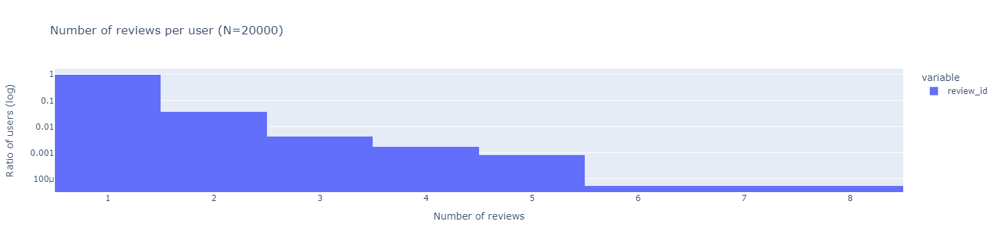

In [6]:
pyo.init_notebook_mode()

# Number of reviews per user
reviews_per_user = reviews_academic_df.groupby("user_id").count()["review_id"]

fig = px.histogram(
    reviews_per_user,
    title=f"Number of reviews per user (N={len(reviews_academic_df)})",
    log_y=True,
    histnorm="probability density",
)
fig.update_layout(
    xaxis_title_text="Number of reviews",
    yaxis_title_text="Ratio of users (log)",
)
fig.show()

Most users (~97%) write only one review.

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



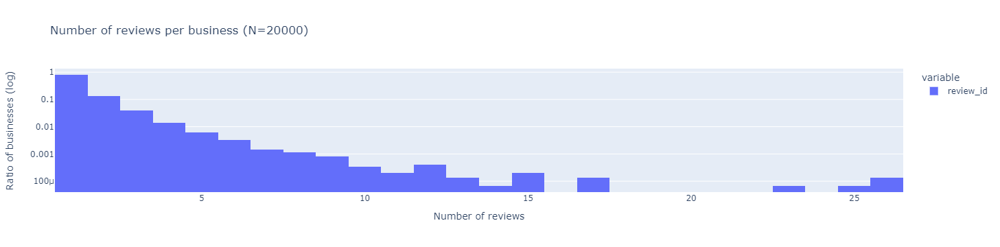

In [7]:
# Number of reviews per business
reviews_per_business = reviews_academic_df.groupby("business_id").count()["review_id"]

fig = px.histogram(
    reviews_per_business,
    title=f"Number of reviews per business (N={len(reviews_academic_df)})",
    log_y=True,
    histnorm="probability density",
)
fig.update_layout(
    xaxis_title_text="Number of reviews",
    yaxis_title_text="Ratio of businesses (log)",
)
fig.show()

Most businesses (~87%) have only one review.

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



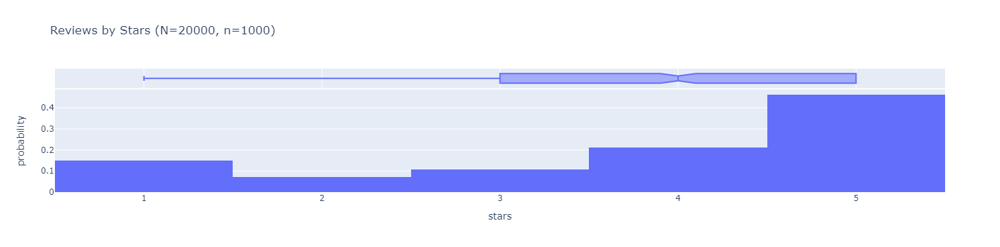

In [8]:
# Number of reviews per stars
fig = px.histogram(
    reviews_academic_df.sample(1000, random_state=42),
    x="stars",
    title=f"Reviews by Stars (N={len(reviews_academic_df)}, n=1000)",
    marginal="box",
    histnorm="probability",
)
fig.show()

Stars distribution: half of the reviews are 5 stars. 

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\ezequ\miniconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



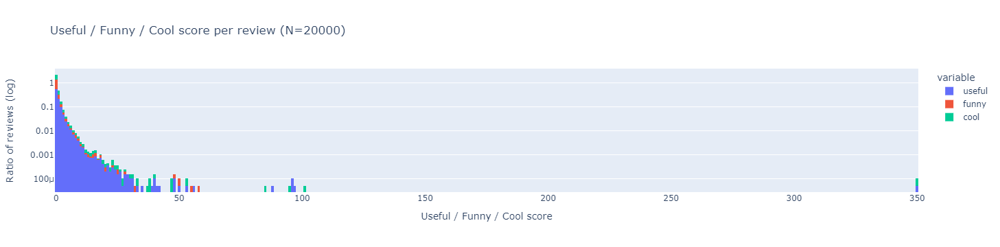

In [9]:
# Number of reviews per reaction
fig = px.histogram(
    reviews_academic_df[["useful", "funny", "cool"]],
    title=f"Useful / Funny / Cool score per review (N={len(reviews_academic_df)})",
    log_y=True,
    histnorm="probability density",
    barmode="stack",
)
fig.update_layout(
    xaxis_title_text="Useful / Funny / Cool score",
    yaxis_title_text="Ratio of reviews (log)",
)
fig.show()

We observed that each review has reactions ("useful", "funny", "cool")

### Analysis of dissatisfaction topics
#### Pre-processing and analysis of textual data
Let's look at the number of comments per note. Let's draw a bar chart

In [10]:
reviews_json = reviews_academic_df.copy()

In [11]:
reviews_json.columns = ["rw_id", "user_id", "business_id", "rw_rating", "useful", "funny", "cool", "rw_text", "date"]

In [12]:
reviews_json

,rw_id,user_id,business_id,rw_rating,useful,funny,cool,rw_text,date
1295256,J5Q1gH4ACCj6CtQG7Yom7g,56gL9KEJNHiSDUoyjk2o3Q,8yR12PNSMo6FBYx1u5KPlw,2,1,0,0,Went for lunch and found that my burger was me...,2018-04-04 21:09:53
3297618,HlXP79ecTquSVXmjM10QxQ,bAt9OUFX9ZRgGLCXG22UmA,pBNucviUkNsiqhJv5IFpjg,5,0,0,0,I needed a new tires for my wife's car. They h...,2020-05-24 12:22:14
1217795,JBBULrjyGx6vHto2osk_CQ,NRHPcLq2vGWqgqwVugSgnQ,8sf9kv6O4GgEb0j1o22N1g,5,0,0,0,Jim Woltman who works at Goleta Honda is 5 sta...,2019-02-14 03:47:48
3730348,U9-43s8YUl6GWBFCpxUGEw,PAxc0qpqt5c2kA0rjDFFAg,XwepyB7KjJ-XGJf0vKc6Vg,4,0,0,0,Been here a few times to get some shrimp. The...,2013-04-27 01:55:49
1826590,8T8EGa_4Cj12M6w8vRgUsQ,BqPR1Dp5Rb_QYs9_fz9RiA,prm5wvpp0OHJBlrvTj9uOg,5,0,0,0,This is one fantastic place to eat whether you...,2019-05-15 18:29:25
...,...,...,...,...,...,...,...,...,...
934855,OxSEwqwoBK3BCfzLp6T6-A,mUyfik3zgUQqbAMATW6xtw,CIKXmAMtVM7pU0rrBQ2cBA,5,1,0,0,I'm so lucky to have this place right in my ne...,2014-01-12 02:59:19
6344774,zQ_kZLqRa3f_U8Inh7kd0w,G6-THBuq3x_q3Kb106CJpw,EmJF-xSIOaEEOWcK8UOBqg,5,0,0,0,This place is great!! Their mussels are maybe ...,2018-03-18 04:07:36
1198966,p74kVMKlav9wnDRqXVGH9A,N5fd36xJuEEHAHLHFirVCg,VlbhF2v7WmmuVaycSe--RA,3,1,1,1,"I want to say I loved it but I can't .,.\nI us...",2014-11-21 08:31:36
2336235,CXEu02ZIc2pusNjXPDQm6Q,Ho4c4W8LjxVx8beP21oiLA,2bugq0djs9WnBMHaIr4iYw,5,0,0,0,"Awesome staff, incredible coffee roasts. Owner...",2014-12-28 13:51:53


In [13]:
# Reset the index of DataFrame
# reset_index() method sets a list of integer ranging from 0 to length of data as index.

reviews_json = reviews_json.reset_index()
del reviews_json["index"]
reviews_json.head(2)

,rw_id,user_id,business_id,rw_rating,useful,funny,cool,rw_text,date
0,J5Q1gH4ACCj6CtQG7Yom7g,56gL9KEJNHiSDUoyjk2o3Q,8yR12PNSMo6FBYx1u5KPlw,2,1,0,0,Went for lunch and found that my burger was me...,2018-04-04 21:09:53
1,HlXP79ecTquSVXmjM10QxQ,bAt9OUFX9ZRgGLCXG22UmA,pBNucviUkNsiqhJv5IFpjg,5,0,0,0,I needed a new tires for my wife's car. They h...,2020-05-24 12:22:14


**The goal is to discover unsatisfactory topics, we start by looking at an extract of our data**.

In [14]:
reviews_json["rw_text"]

0        Went for lunch and found that my burger was me...
1        I needed a new tires for my wife's car. They h...
2        Jim Woltman who works at Goleta Honda is 5 sta...
3        Been here a few times to get some shrimp.  The...
4        This is one fantastic place to eat whether you...
                               ...                        
19995    I'm so lucky to have this place right in my ne...
19996    This place is great!! Their mussels are maybe ...
19997    I want to say I loved it but I can't .,.\nI us...
19998    Awesome staff, incredible coffee roasts. Owner...
19999    This used to be the best Chinese restaurant ar...
Name: rw_text, Length: 20000, dtype: object

We observe line breaks and the presence of punctuation in the text. We must therefore remove these characters. Let's create a function to process the text.

In [15]:
# the function unidecode() takes Unicode data and tries to represent it in ASCII characters (i.e., the universally displayable characters between 0x00 and 0x7F),
# where the compromises taken when mapping between two character sets are chosen to be near what a human with a US keyboard would choose.

unidecode("holà como estàs y èfezhfezé&")

'hola como estas y efezhfeze&'

In [16]:
def text_cleaning(text, ponct, only_letters, numbers):
    text = text.lower()
    text = unidecode(text)
    ponctuation = "[^!\"#$%&'()*+,-./:;<=>?@[\]^_`{|}~]"
    number = "[^0-9]"
    letters = "[^a-zA-Z ]"
    if ponct == 1:
        text = re.sub(ponctuation, '', text)
    if only_letters == 1:
        text = re.sub(letters, '', text)
    if numbers == 1:
        text = re.sub(number, '', text)
    return text

<>:4: DeprecationWarning:

invalid escape sequence \]

<>:4: DeprecationWarning:

invalid escape sequence \]

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\1984558355.py:4: DeprecationWarning:

invalid escape sequence \]



Let's put the text in **lower case**.

In [17]:
reviews_json["rw_text"] = reviews_json["rw_text"].str.lower()

Let's apply the function to write the whole **contractions**.

In [18]:
#Treat contractions => shouldn't => should not
reviews_json['rw_text'] = reviews_json.progress_apply(lambda x: contractions.fix(x['rw_text']),axis=1)

100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:01<00:00, 13669.75it/s]


Let's remove the **punctuation**.

In [19]:
reviews_json['rw_text'] = reviews_json.progress_apply(lambda x: text_cleaning(x['rw_text'], 0, 1, 0),axis=1)

100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 28999.91it/s]


We can separate the text into word lists => each word unit is a **tokens**

In [20]:
reviews_json['words'] = reviews_json.progress_apply(lambda x: word_tokenize(x['rw_text']),axis=1)

100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:07<00:00, 2850.53it/s]


Let's count the number of words per comment

In [21]:
reviews_json['nb_words'] = reviews_json.progress_apply(lambda x: len(x['words']),axis=1)

100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 72090.61it/s]


In [22]:
reviews_json["nb_words"].describe()

count    20000.000000
mean       103.424750
std         96.092357
min          1.000000
25%         41.000000
50%         74.000000
75%        132.000000
max        981.000000
Name: nb_words, dtype: float64

**We have an average of 102 words per comment. And 50% of the comments are more than 74 words long.**

Let's look at the most frequent words. For that, we will tokenize the text

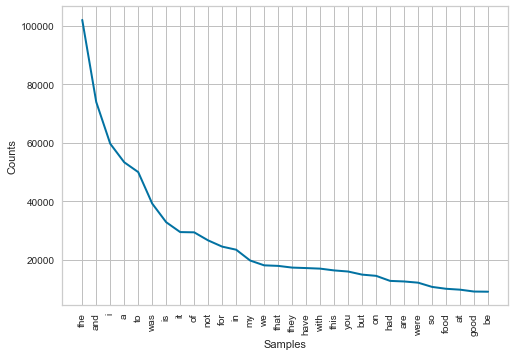

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [23]:
words = nltk.tokenize.word_tokenize(" ".join(reviews_json['rw_text']))
fdist = nltk.FreqDist(words)
fdist.plot(30)

We observe that there are determiners such as: "the, and, i, a, to", which are very frequent. We have to remove these words because they don't bring any information about the subject or the feeling of the comment.

### Cleaning
- Stopwords
- to keep the root of the words:
        -lemmatisation 
        -stemming

Let's try to use the nltk library, in order to remove the words that don't bring any information.

In [24]:
nltk.download('stopwords')
sw_nltk = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ezequ\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In the stopwords list of the package, there are words that are important for the identification of feelings like "very" or negations ("not"...). Let's remove these elements from the stopwords list. Also, the package removes some verbs like be and have. We want to keep these verbs for sentiment analysis.

In [25]:
keep_words = ['not', 'but', 'if', 'because', 'against', 'between', 
              'during', 'before', 'after', 'again', 'more', 'most', 
              'such', 'only', 'own', 'same', 'than', 'too', 'very']
new_sw_nltk = [word for word in sw_nltk if word not in keep_words]

new_sw_nltk.extend(['th','pm', 's', 'er', 'paris', 'rst', 'st', 'am', 'us'])

These words do not bring any meaning regarding the feelings in the sentences. In other words, they are so-called empty words for our project.

In [26]:
pat = r'\b(?:{})\b'.format('|'.join(new_sw_nltk))
cleaning = reviews_json['rw_text'].str.replace(pat, '')
reviews_json['new_words'] = cleaning.progress_apply(lambda x: nltk.word_tokenize(x))
reviews_json['new_text'] = cleaning

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\1862629513.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.

100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:06<00:00, 3243.80it/s]


Let's study again the most frequent words.

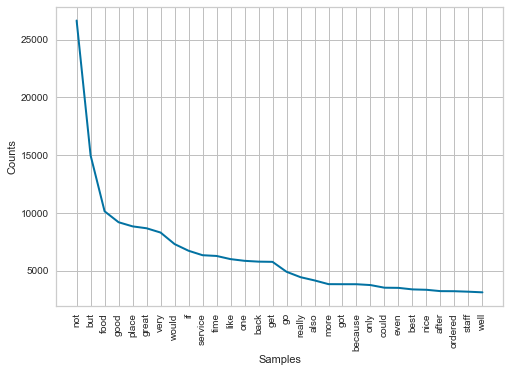

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [27]:
words = nltk.tokenize.word_tokenize(" ".join(reviews_json["new_text"]))
fdist = nltk.FreqDist(words)
fdist.plot(30)

We no longer have words called empty. Now we have to keep the root of the words. There are two methods: Stemming and lemmatization. Stemming removes suffixes and prefixes from words without taking the context into account. Unlike stemming, lemmatization considers the context and converts the word into its "meaningful" base form.

We can delete the unnecessary columns

In [28]:
reviews_json = reviews_json.drop(["user_id", "business_id", "useful", "funny", "cool", "date", "new_words", "words"], axis=1)
reviews_json.head(2)

,rw_id,rw_rating,rw_text,nb_words,new_text
0,J5Q1gH4ACCj6CtQG7Yom7g,2,went for lunch and found that my burger was me...,78,went lunch found burger meh obvious ...
1,HlXP79ecTquSVXmjM10QxQ,5,i needed a new tires for my wifes car they had...,55,needed new tires wifes car special orde...


Let's create a function.

In [29]:
# The process of classifying words into their parts of speech and labeling 
# them accordingly is known as part-of-speech tagging, POS-tagging, or simply tagging. 

def word_pos_tagger(list_words):
    pos_tagged_text = nltk.pos_tag(list_words)
    return pos_tagged_text

Let's concatenate the words of the different documents because we want to see what is the nature of the words in our corpus in order to keep only the useful types.

In [30]:
all_reviews = reviews_json["new_text"].str.cat(sep=' ')
description_words = word_pos_tagger(nltk.word_tokenize(all_reviews))

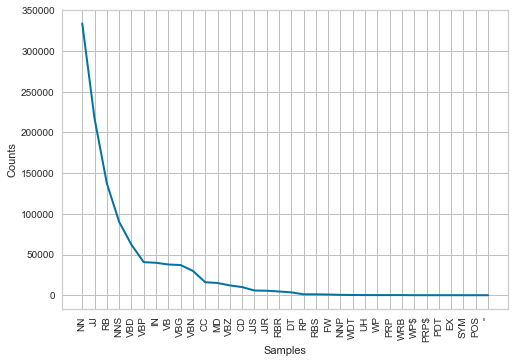

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [31]:
tag_fd = nltk.FreqDist(tag for (word, tag) in description_words)
tag_fd.plot()

In [32]:
list_keep = []
list_excl = ['IN', 'DT', 'CD', 'CC', 'RP', 'WDT', 'EX', 'MD', 'NNP', 'WDT', 'UH', 'WRB', 
'WP', 'WP$', 'PDT', 'PRP$', 'EX', 'POS', 'SYM', 'TO', 'NNPS']
for word, tag in description_words:
    if tag not in list_excl:
        list_keep.append(tag)

In [33]:
reviews_json["text_tokens_pos_tagged"] =  reviews_json["new_text"].progress_apply(lambda x: nltk.word_tokenize(x))

100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:04<00:00, 4185.44it/s]


In [34]:
reviews_json["text_tokens_pos_tagged"] =  reviews_json["text_tokens_pos_tagged"].progress_apply(lambda x: nltk.pos_tag(x))

100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:21<00:00, 245.22it/s]


Let's arrange the created list

In [35]:
list_keep = set(list_keep)

In [36]:
list_keep = list(list_keep)

In [37]:
reviews_json["text_tagged_nn_vb"] =  reviews_json["text_tokens_pos_tagged"].progress_apply(lambda x: [y for y, tag in x if tag in list_keep])

100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 31615.31it/s]


In [38]:
list_nouns = ["NN", "NNS"]

reviews_json["words_subjects"] =  reviews_json["text_tokens_pos_tagged"].progress_apply(lambda x: [y for y, tag in x if tag in list_nouns])


100%|████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 115227.82it/s]


In [39]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,nb_words,new_text,text_tokens_pos_tagged,text_tagged_nn_vb,words_subjects
0,J5Q1gH4ACCj6CtQG7Yom7g,2,went for lunch and found that my burger was me...,78,went lunch found burger meh obvious ...,"[(went, VBD), (lunch, NN), (found, VBN), (burg...","[went, lunch, found, burger, meh, obvious, foc...","[lunch, focus, burgers, random, crap, meat, bu..."
1,HlXP79ecTquSVXmjM10QxQ,5,i needed a new tires for my wifes car they had...,55,needed new tires wifes car special orde...,"[(needed, VBN), (new, JJ), (tires, NNS), (wife...","[needed, new, tires, wifes, car, special, orde...","[tires, car, order, day, morning, work, hours,..."


In [40]:
# The join() method takes all items in an iterable and joins them into one string.
reviews_json["words_subjects"] =  reviews_json["words_subjects"].progress_apply(lambda x: " ".join(x))

100%|████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 260435.70it/s]


In [41]:
reviews_json["text_tagged_nn_vb"] =  reviews_json["text_tagged_nn_vb"].progress_apply(lambda x: " ".join(x))

100%|████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 217975.38it/s]


Concerning the **treatment of dissatisfaction topics**, it would also be interesting to **keep the root of the words** after filtering on the names.
There are two methods:

    - Stemming removes suffixes and prefixes from words without taking the context into consideration. 
    - Lemmatization method considers the context and converts the word into its "meaningful" base form.

In [42]:
def stemming_text(word):
    stemmer = SnowballStemmer(language='english')
    return stemmer.stem(word)
 
def lemmatize_text(text):
    lemmatizer = nltk.stem.WordNetLemmatizer()
    # w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
    return lemmatizer.lemmatize(text)

In [43]:
# Snowball Stemmer is also known as the Porter2 stemming algorithm because it is a better version of the Porter Stemmer. It is more aggressive than Porter Stemmer.

#Test
print(stemming_text("running"))
print(lemmatize_text("days"))

run
day


In [44]:
reviews_json["words_subjects_st"] = reviews_json["words_subjects"].progress_apply(lambda x: stemming_text(x))

100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 28011.55it/s]


In [45]:
reviews_json["words_subjects_lem"] = reviews_json["words_subjects"].progress_apply(lambda x: lemmatize_text(x))

100%|████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 178275.44it/s]


In [46]:
reviews_json["text_tagged_nn_vb_st"] =  reviews_json["text_tagged_nn_vb"].progress_apply(lambda x: stemming_text(x))


100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:01<00:00, 15844.49it/s]


In [47]:
reviews_json["text_tagged_nn_vb_lem"] =  reviews_json["text_tagged_nn_vb"].progress_apply(lambda x: lemmatize_text(x))


100%|████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 186687.73it/s]


In [48]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,nb_words,new_text,text_tokens_pos_tagged,text_tagged_nn_vb,words_subjects,words_subjects_st,words_subjects_lem,text_tagged_nn_vb_st,text_tagged_nn_vb_lem
0,J5Q1gH4ACCj6CtQG7Yom7g,2,went for lunch and found that my burger was me...,78,went lunch found burger meh obvious ...,"[(went, VBD), (lunch, NN), (found, VBN), (burg...",went lunch found burger meh obvious focus burg...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,went lunch found burger meh obvious focus burg...,went lunch found burger meh obvious focus burg...
1,HlXP79ecTquSVXmjM10QxQ,5,i needed a new tires for my wifes car they had...,55,needed new tires wifes car special orde...,"[(needed, VBN), (new, JJ), (tires, NNS), (wife...",needed new tires wifes car special order next ...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,needed new tires wifes car special order next ...,needed new tires wifes car special order next ...


Let's look at the most frequent words for each method

In [49]:
# Let's make a function to count the number of words and make the graph

def nb_most_frequent_plt(df_var):
    words = nltk.tokenize.word_tokenize(" ".join(df_var))
    fdist = nltk.FreqDist(words)
    fdist.plot(30)

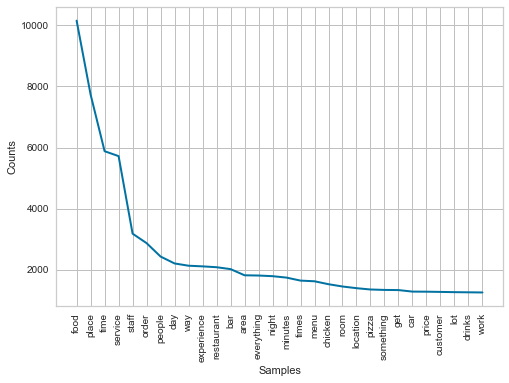

In [50]:
nb_most_frequent_plt(reviews_json["words_subjects_st"])

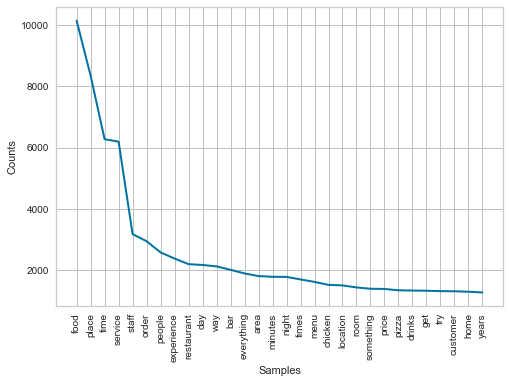

In [51]:
nb_most_frequent_plt(reviews_json["words_subjects_lem"])

### Feeling analysis

We use **Vader** to get the **sentiment impressions of word** pairs (positive, neutral, negative).

**VADER** (Valence Aware Dictionary and sEntiment Reasoner) is a lexical database and rule-based sentiment analysis tool that is optimized for social media sentiments. It makes use of a variety of techniques. A sentiment lexicon is a collection of lexical features (e.g., words) that are classified as positive or negative depending on their sentiment polarity. It not only exhibits the Positivity and Negativity scores, but also the degree to which a sentiment is positive or negative

Let's create a function to get information about the feelings of groups of words.

In [52]:
# function to print sentiments of the sentence.

def sentiment_scores(sentence):
 
    # Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()
 
    # polarity_scores method of SentimentIntensityAnalyzer
    # object gives a sentiment dictionary.
    # which contains pos, neg, neu, and compound scores.
    sentiment_dict = sid_obj.polarity_scores(sentence)
    
    return sentiment_dict

Now let's use our function and create a new column for the VADER score

In [53]:
reviews_json["text_nn_vb_lem_feels"] = reviews_json["text_tagged_nn_vb_lem"].progress_apply(lambda x: sentiment_scores(x))

100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [04:19<00:00, 77.06it/s]


In [54]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,nb_words,new_text,text_tokens_pos_tagged,text_tagged_nn_vb,words_subjects,words_subjects_st,words_subjects_lem,text_tagged_nn_vb_st,text_tagged_nn_vb_lem,text_nn_vb_lem_feels
0,J5Q1gH4ACCj6CtQG7Yom7g,2,went for lunch and found that my burger was me...,78,went lunch found burger meh obvious ...,"[(went, VBD), (lunch, NN), (found, VBN), (burg...",went lunch found burger meh obvious focus burg...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,went lunch found burger meh obvious focus burg...,went lunch found burger meh obvious focus burg...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp..."
1,HlXP79ecTquSVXmjM10QxQ,5,i needed a new tires for my wifes car they had...,55,needed new tires wifes car special orde...,"[(needed, VBN), (new, JJ), (tires, NNS), (wife...",needed new tires wifes car special order next ...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,needed new tires wifes car special order next ...,needed new tires wifes car special order next ...,"{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'comp..."


In [55]:
reviews_json['text_nn_vb_lem_feels'].head()

0    {'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...
1    {'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'comp...
2    {'neg': 0.0, 'neu': 0.486, 'pos': 0.514, 'comp...
3    {'neg': 0.0, 'neu': 0.635, 'pos': 0.365, 'comp...
4    {'neg': 0.0, 'neu': 0.338, 'pos': 0.662, 'comp...
Name: text_nn_vb_lem_feels, dtype: object

Let's add the different columns obtained in our dataframe.

In [56]:
reviews_json = pd.concat([reviews_json, 
    reviews_json['text_nn_vb_lem_feels'].apply(pd.Series)]
    , axis=1)

In [57]:
del reviews_json["text_tokens_pos_tagged"]

Let's rename the columns

In [58]:
reviews_json.columns = ['rw_id','rw_rating', 'rw_text', 'nb_words', 'new_text', 'text_tagged_nn_vb', 
                    'words_subjects', 'words_subjects_st', 'words_subjects_lem', 'text_tagged_nn_vb_st',
                    'text_nn_vb_lem_feels', 'text_tagged_nn_vb_lem', 'feeling_neg', 'feeling_neu', 'feeling_pos', 'feeling_compound']

In [59]:
# del reviews_json['index']

In [60]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,nb_words,new_text,text_tagged_nn_vb,words_subjects,words_subjects_st,words_subjects_lem,text_tagged_nn_vb_st,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,feeling_compound
0,J5Q1gH4ACCj6CtQG7Yom7g,2,went for lunch and found that my burger was me...,78,went lunch found burger meh obvious ...,went lunch found burger meh obvious focus burg...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,went lunch found burger meh obvious focus burg...,went lunch found burger meh obvious focus burg...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...",0.112,0.888,0.000,-0.4404
1,HlXP79ecTquSVXmjM10QxQ,5,i needed a new tires for my wifes car they had...,55,needed new tires wifes car special orde...,needed new tires wifes car special order next ...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,needed new tires wifes car special order next ...,needed new tires wifes car special order next ...,"{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'comp...",0.000,0.598,0.402,0.9022


In [61]:
# del reviews_json["text_tagged_nn_vb_lem"]

Let's create a function to add a label to have an "average" feeling

In [62]:
def feeling_avg(compound, pos, neg):
    # decide sentiment as positive, negative and neutral
    if compound >= 0.05 and pos>0.5 :
        feeling_avg = "Positive"
    elif compound <= - 0.05  and neg > 0.2 :
        feeling_avg = "Negative"
    else :
        feeling_avg = "Neutral"
    return feeling_avg

In [63]:
reviews_json["feeling_avg"] = reviews_json.progress_apply(lambda x: feeling_avg(x["feeling_compound"], x["feeling_pos"], x["feeling_neg"]), axis=1)

100%|█████████████████████████████████████████████████████████████████████████| 20000/20000 [00:00<00:00, 50072.48it/s]


In [64]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,nb_words,new_text,text_tagged_nn_vb,words_subjects,words_subjects_st,words_subjects_lem,text_tagged_nn_vb_st,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,feeling_compound,feeling_avg
0,J5Q1gH4ACCj6CtQG7Yom7g,2,went for lunch and found that my burger was me...,78,went lunch found burger meh obvious ...,went lunch found burger meh obvious focus burg...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,lunch focus burgers random crap meat burger pa...,went lunch found burger meh obvious focus burg...,went lunch found burger meh obvious focus burg...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...",0.112,0.888,0.000,-0.4404,Neutral
1,HlXP79ecTquSVXmjM10QxQ,5,i needed a new tires for my wifes car they had...,55,needed new tires wifes car special orde...,needed new tires wifes car special order next ...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,tires car order day morning work hours car eff...,needed new tires wifes car special order next ...,needed new tires wifes car special order next ...,"{'neg': 0.0, 'neu': 0.598, 'pos': 0.402, 'comp...",0.000,0.598,0.402,0.9022,Neutral


Let's look at the results obtained by the Vader method.

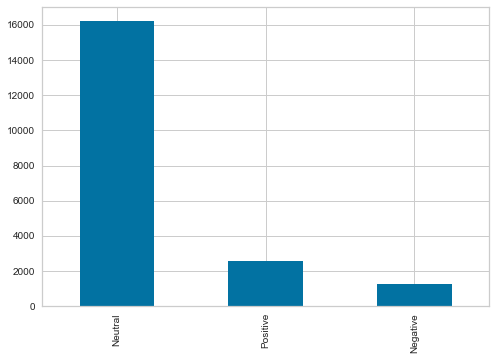

In [65]:
reviews_json.feeling_avg.value_counts().plot(kind='bar')
plt.show()

In [66]:
reviews_sav = reviews_json.copy()

### Negative comments

We will keep only comments with negative feeling_avg

In [67]:
reviews_json = reviews_sav.loc[(reviews_sav["rw_rating"]<=2) & (reviews_sav["feeling_avg"] == 'Negative')].head(10000).copy() # AJOUTER LE NOTE NEGATIVE

In [68]:
# df2=df.loc[(df['Discount'] >= 1000) & (df['Discount'] <= 2000)]

In [69]:
# reviews_json = reviews_sav.loc[reviews_sav["feeling_avg"] == 'Negative'].head(10000).copy() # AJOUTER LE NOTE NEGATIVE
reviews_json

,rw_id,rw_rating,rw_text,nb_words,new_text,text_tagged_nn_vb,words_subjects,words_subjects_st,words_subjects_lem,text_tagged_nn_vb_st,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,feeling_compound,feeling_avg
6,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,86,unbelievably poor customer service beyond bad...,unbelievably poor customer service bad insiste...,customer service car price wash midsize car ta...,customer service car price wash midsize car ta...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,0.045,-0.8835,Negative
18,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,57,sorrythis place not good beer sub par fo...,sorrythis place not good beer sub par food cam...,place beer sub par food somehow tab hands beer...,place beer sub par food somehow tab hands beer...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,0.142,-0.6711,Negative
28,h6saTwVhHy7cU_df7ks2Ow,1,this place is ridiculous when dealing with th...,107,place ridiculous dealing owner time ...,place ridiculous dealing owner time messed ver...,place owner time everything company use servic...,place owner time everything company use servic...,place owner time everything company use servic...,place ridiculous dealing owner time messed ver...,place ridiculous dealing owner time messed ver...,"{'neg': 0.23, 'neu': 0.633, 'pos': 0.136, 'com...",0.230,0.633,0.136,-0.6718,Negative
34,guM4RzhJm4Svh6o70MyOGw,2,food was okay nothing to come back for honestl...,123,food okay nothing come back honestly servi...,food okay nothing come back honestly service n...,food okay nothing service reason rating slow o...,food okay nothing service reason rating slow o...,food okay nothing service reason rating slow o...,food okay nothing come back honestly service n...,food okay nothing come back honestly service n...,"{'neg': 0.251, 'neu': 0.629, 'pos': 0.12, 'com...",0.251,0.629,0.120,-0.7890,Negative
49,6moXprIoZQnL82vAiCTY1Q,1,always unhappy with service there one time i b...,95,always unhappy service one time brought pa...,always unhappy service time brought package ma...,service time package behnd counter rent mailbo...,service time package behnd counter rent mailbo...,service time package behnd counter rent mailbo...,always unhappy service time brought package ma...,always unhappy service time brought package ma...,"{'neg': 0.299, 'neu': 0.701, 'pos': 0.0, 'comp...",0.299,0.701,0.000,-0.9368,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,LJuGQfgrl8x63JLwlmTHsg,2,so sad to see an ll that serves such bad food ...,129,sad see serves such bad food eaten exce...,sad see serves such bad food eaten excellent f...,serves food food hawaii sacramento elk sacrame...,serves food food hawaii sacramento elk sacrame...,serves food food hawaii sacramento elk sacrame...,sad see serves such bad food eaten excellent f...,sad see serves such bad food eaten excellent f...,"{'neg': 0.233, 'neu': 0.632, 'pos': 0.135, 'co...",0.233,0.632,0.135,-0.7623,Negative
19945,jDBnD3L-QwpcgDhSVHDC7Q,1,the most horrible service i have ever witnesse...,89,most horrible service ever witnessed put ...,most horrible service ever witnessed put star ...,service star food alright things visit person ...,service star food alright things visit person ...,service star food alright things visit person ...,most horrible service ever witnessed put star ...,most horrible service ever witnessed put star ...,"{'neg': 0.282, 'neu': 0.625, 'pos': 0.093, 'co...",0.282,0.625,0.093,-0.8748,Negative
19956,5-1BfDyhK3_KGpclo4vgJw,1,terrible customer service would not meet me at...,29,terribl

**We will continue the analysis with ~1000 negatives comments**

### World of clouds
Let's look at the topics that stand out using a word of cloud graph

To do that, we will select only the negative comments 

Let's compare the methods: 
- 1) simple,
- 2) with stemming
- 3) with lemmatization

In [70]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

# Let's create a function

def wordcloud_plot(data):
    all_reviews = data.str.cat(sep=' ')
    wordcloud = WordCloud(background_color = 'white', max_words = 100).generate(all_reviews)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

**Simple**:

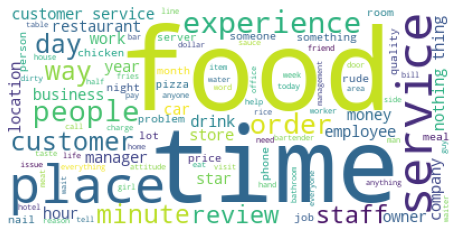

In [71]:
wordcloud_plot(reviews_json["words_subjects"])

We notice that the main topics are the meal, the location, the service, the waiting time for the first method.

**stemming method**.

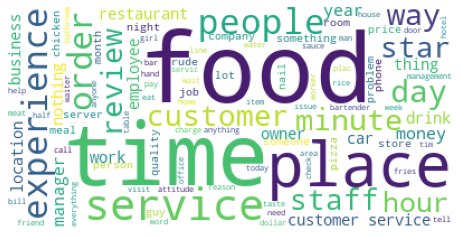

In [72]:
wordcloud_plot(reviews_json["words_subjects_st"])

We obtain almost the same results as before with the stemming method. Even if the importance of words like time and service have increased.

**lemmatization method**:

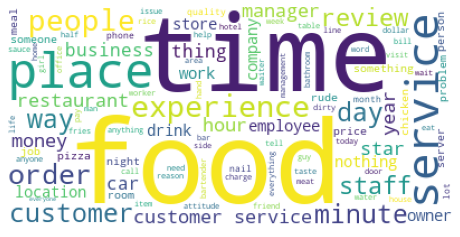

In [73]:
wordcloud_plot(reviews_json["words_subjects_lem"])

This method seems to give better results. Indeed, the topics of dissatisfaction seem to be: location, food quality, waiting time, service and menus.

The words "service" and "experience" have become more important thanks to this method.

So, we will keep the results from lammelization method 

In [74]:
# Let's remove the columns we are not going to use

reviews_json = reviews_json.drop(["words_subjects", "nb_words", "text_tagged_nn_vb", "words_subjects_st", "text_tagged_nn_vb_st"],axis=1)

In [75]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,new_text,words_subjects_lem,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,feeling_compound,feeling_avg
6,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,unbelievably poor customer service beyond bad...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,0.045,-0.8835,Negative
18,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,sorrythis place not good beer sub par fo...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,0.142,-0.6711,Negative


### Feature creation: two methods BOW & TF-IDF

#### Bags of words (BOW)

The bags of words approach consists in counting the occurrences of each word in each document of the database.

In [76]:
reviews_json.shape

(1027, 12)

In [77]:
reviews_json = reviews_json.reset_index()

In [78]:
# create an object vector 

vectorizer = CountVectorizer()
corpus = reviews_json["words_subjects_lem"]

# learn the vocabulary and store the CountVectorizer sparse matrix in X cbow = vectorizer.fit_transform(corpus).todense()
cbow = vectorizer.fit_transform(corpus).todense()
new_cols = vectorizer.get_feature_names_out()

In [79]:
# join the tfidf values to the existing dataframe
reviews_json = reviews_json.join(pd.DataFrame(cbow, columns=new_cols),rsuffix="_left")

In [80]:
reviews_json.head(2)

,index,rw_id,rw_rating,rw_text,new_text,words_subjects_lem,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,...,yrs,yucca,yuck,yuk,yum,yuppies,zebra,zero,zom,zoo
0,6,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,unbelievably poor customer service beyond bad...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,...,0,0,0,0,0,0,0,0,0,0
1,18,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,sorrythis place not good beer sub par fo...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,...,0,0,0,0,0,0,0,0,0,0


#### TF-IDF

This method allows us to better define the importance of a word for a document, while taking into account the relationship with other documents in the same corpus.
We will compute a score for each word of each document in our dataset. And for each word, the TF-IDF value increases with each appearance of the word in a document, but gradually decreases with each appearance in other documents.

Let's create a DataFrame with the tf-Idf features

In [81]:
tfIdfVectorizer=TfidfVectorizer(use_idf=True)
tfIdf = tfIdfVectorizer.fit_transform(reviews_json["words_subjects_lem"]).todense()
new_cols = vectorizer.get_feature_names()


C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [82]:
tfidf_df = pd.DataFrame(tfIdf, columns=new_cols)

In [83]:
tfidf_df.head(2)

,ability,abners,abomination,abortion,aboutsteer,abovei,abraham,absolute,abuse,ac,...,yrs,yucca,yuck,yuk,yum,yuppies,zebra,zero,zom,zoo
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Let's perform the join between our dataframe and the new columns

In [84]:
# join the tfidf values to the existing dataframe
reviews_json = reviews_json.join(tfidf_df, rsuffix='_tfidf')

In [85]:
del reviews_json["index"]

In [86]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,new_text,words_subjects_lem,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,...,yrs_tfidf,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf
0,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,unbelievably poor customer service beyond bad...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,0.045,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,sorrythis place not good beer sub par fo...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,0.142,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [87]:
df_acp = reviews_json.copy()


In [88]:
df_acp.head(2)

,rw_id,rw_rating,rw_text,new_text,words_subjects_lem,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,...,yrs_tfidf,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf
0,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,unbelievably poor customer service beyond bad...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,0.045,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,sorrythis place not good beer sub par fo...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,0.142,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We delete columns that are no longer needed.

In [89]:
df_acp2 = df_acp.drop(["rw_id", "rw_rating", "rw_text", "new_text", "words_subjects_lem", "text_nn_vb_lem_feels", "text_tagged_nn_vb_lem"], axis=1)

In [90]:
# df_acp2 = df_acp2.drop(["words_subjects_st", "text_tagged_nn_vb", "words_subjects_st", "text_tagged_nn_vb_st"], axis=1)

In [91]:
# del df_acp2["words_subjects"]

In [92]:
df_acp2.head(2)

,feeling_neg,feeling_neu,feeling_pos,feeling_compound,feeling_avg,ability,abners,abomination,abortion,aboutsteer,...,yrs_tfidf,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf
0,0.252,0.702,0.045,-0.8835,Negative,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.290,0.568,0.142,-0.6711,Negative,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [93]:
df_pca = df_acp2.copy()

In [94]:
# df_acp2 = df_acp2.drop(["words_subjects_st", "text_tagged_nn_vb", "words_subjects_st", "text_tagged_nn_vb_st"], axis=1)

In [95]:
# del df_acp2["text_tagged_nn_vb_lem"]

In [96]:
df_acp2.head(2) 

,feeling_neg,feeling_neu,feeling_pos,feeling_compound,feeling_avg,ability,abners,abomination,abortion,aboutsteer,...,yrs_tfidf,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf
0,0.252,0.702,0.045,-0.8835,Negative,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.290,0.568,0.142,-0.6711,Negative,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Now that we have our features. We can proceed to the multivariate analysis.

### Multidimensional analysis : PCA / T-SNE

Let's start with the principal compound analysis

#### PCA

In [97]:
del df_acp2["feeling_avg"]

In [98]:
# del df_acp2["text_tagged_nn_vb_lem"]

In [99]:
df_acp2.describe(include="all", datetime_is_numeric=True)

,feeling_neg,feeling_neu,feeling_pos,feeling_compound,ability,abners,abomination,abortion,aboutsteer,abovei,...,yrs_tfidf,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf
count,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,...,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000,1027.000000
mean,0.290236,0.621799,0.087952,-0.718420,0.002921,0.000974,0.000974,0.001947,0.000974,0.000974,...,0.000412,0.000518,0.000821,0.000332,0.000423,0.000431,0.000268,0.001204,0.000215,0.000263
std,0.081717,0.096302,0.070750,0.216783,0.069748,0.031204,0.031204,0.044108,0.031204,0.031204,...,0.009595,0.016615,0.014266,0.010652,0.013566,0.013816,0.008598,0.018053,0.006889,0.008420
min,0.201000,0.199000,0.000000,-0.997100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.229000,0.563000,0.000000,-0.885750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.264000,0.630000,0.088000,-0.778700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.333000,0.693000,0.142000,-0.599000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.719000,0.799000,0.325000,-0.051600,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.262849,0.532458,0.317447,0.341376,0.434762,0.442761,0.275549,0.363567,0.220762,0.269846


In [100]:
# let's calculate PCA
print("Dataset dimensions before PCA reduction  : ", df_acp2.shape)
pca = PCA(n_components=0.99)
feat_pca = pca.fit_transform(df_acp2)
print("Dataset dimensions after PCA reduction  : ", feat_pca.shape)

# initialize list of lists
df_feat_pca = feat_pca

df_feat_pca

Dataset dimensions before PCA reduction  :  (1027, 7902)
Dataset dimensions after PCA reduction  :  (1027, 860)


array([[-0.31455261,  0.33970625,  1.02534409, ..., -0.01396692,
        -0.01058846, -0.0483114 ],
       [ 1.14077513, -1.09074007, -0.73971861, ...,  0.00227555,
         0.04328973,  0.00647144],
       [ 0.77558229,  1.67731081,  0.19432746, ...,  0.04764038,
         0.00372628,  0.01515281],
       ...,
       [ 0.05196708, -0.0063243 ,  1.70166503, ..., -0.06785537,
         0.06508774, -0.03721318],
       [-0.68605095,  0.092337  , -0.00224363, ...,  0.11759157,
        -0.04890761,  0.036539  ],
       [-0.1030517 ,  0.13867952,  0.19002511, ..., -0.02350207,
         0.0064185 , -0.02085222]])

#### T-SNE

t-SNE calculates the conditional probabilities of the points according to the other points (the more the distance is distant and the lower the probability). We thus obtain a global probability and we can deduce that the close points are quite similar.

To begin, let's draw a T-SNE with the category indicator.

In [101]:
time_start = time.time()
tsne = TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results = tsne.fit_transform(df_feat_pca)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

# df_feat_pca['tsne1'] = tsne_results[:, 0]
# df_feat_pca['tsne2'] = tsne_results[:, 1]
df_tsne = pd.DataFrame(tsne_results[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = df_acp["feeling_avg"]
# print(df_tsne.shape)

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



t-SNE done! Time elapsed: 10.393648147583008 seconds


In [102]:
df_tsne

,tsne1,tsne2,class
0,-7.956395,-5.853511,Negative
1,0.515536,4.564378,Negative
2,4.285016,-0.774921,Negative
3,-0.343779,3.669749,Negative
4,3.220160,-4.761626,Negative
...,...,...,...
1022,1.773051,3.575051,Negative
1023,1.798661,-3.186161,Negative
1024,0.628116,-3.890471,Negative
1025,-5.731716,-2.258245,Negative


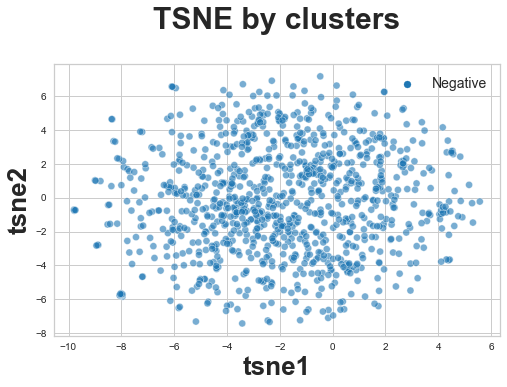

In [103]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=1), s=50, alpha=0.6)

plt.title('TSNE by clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

We cannot distinguish any group

Let us try to apply k-means on the T-SNE data.

### TSNE + Kmeans

In [104]:
X_df = df_acp2

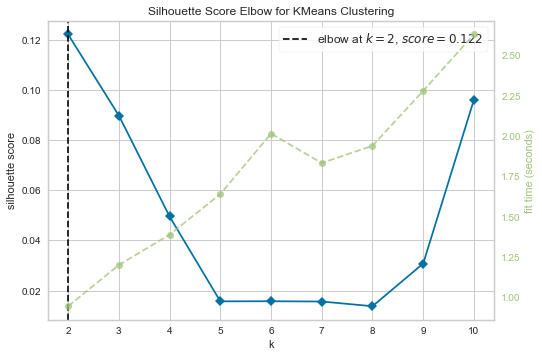

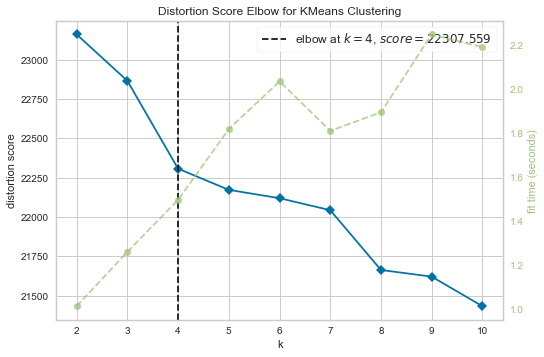

In [105]:
_ = kelbow_visualizer(KMeans(random_state=42), X_df, (2, 10), metric='silhouette')
_ = kelbow_visualizer(KMeans(random_state=42), X_df, (2, 10))

We have to take into account 4 clusters.

In [106]:
cls = cluster.KMeans(n_clusters=4, random_state=6)
cls.fit(tsne_results)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1027, 4)


In [107]:
df_tsne

,tsne1,tsne2,class,cluster
0,-7.956395,-5.853511,Negative,1
1,0.515536,4.564378,Negative,0
2,4.285016,-0.774921,Negative,0
3,-0.343779,3.669749,Negative,2
4,3.220160,-4.761626,Negative,3
...,...,...,...,...
1022,1.773051,3.575051,Negative,0
1023,1.798661,-3.186161,Negative,3
1024,0.628116,-3.890471,Negative,3
1025,-5.731716,-2.258245,Negative,1


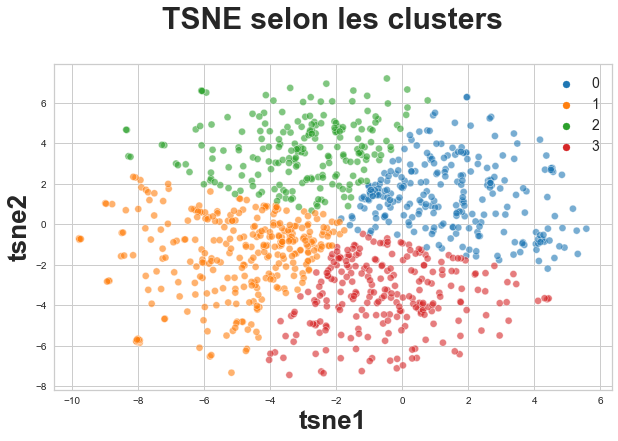

ARI :  0.0


In [108]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=4), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()

labels = df_tsne["class"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

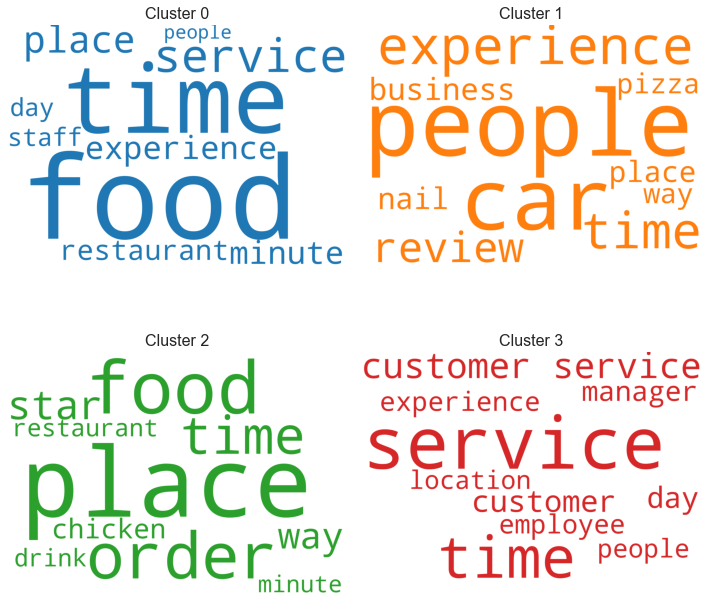

In [109]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

# topics = X_df

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = df_acp["words_subjects_lem"].loc[df_tsne["cluster"]==i]
    all_reviews = topic_words.str.cat(sep=' ')
    cloud.generate(all_reviews)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Cluster ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

We notice that k-means has a hard time to differentiate the different topics, we find the word "time" in each topic. 

### Topic Modeling
We want to be able to identify the topics of the reviews in order to understand why clients were satisfied or not.

We are going to use a technique to identify the topics of the reviews:

- **LDA : Latent Dirichlet Allocation (LDA) is a probabilistic model that uses a probabilistic graphical model to infer the topic distribution of a document**.

#### LDA

Let's start by performing an LDA. The LDA is a model that simulates the probability of occurrence of words, but also the probability of topics in each document.

In [110]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,new_text,words_subjects_lem,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,...,yrs_tfidf,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf
0,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,unbelievably poor customer service beyond bad...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,0.045,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,sorrythis place not good beer sub par fo...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,0.142,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


To apply an LDA, we need to tokenize our words.

In [111]:
reviews_json["words_token_lem"] = reviews_json["words_subjects_lem"].progress_apply(lambda x: word_tokenize(x))

100%|████████████████████████████████████████████████████████████████████████████| 1027/1027 [00:00<00:00, 6791.76it/s]


In [112]:
reviews_json["words_token_lem"]

0       [customer, service, car, price, wash, midsize,...
1       [place, beer, sub, par, food, somehow, tab, ha...
2       [place, owner, time, everything, company, use,...
3       [food, okay, nothing, service, reason, rating,...
4       [service, time, package, behnd, counter, rent,...
                              ...                        
1022    [serves, food, food, hawaii, sacramento, elk, ...
1023    [service, star, food, alright, things, visit, ...
1024    [customer, service, restaurant, prepay, order,...
1025    [store, tire, center, change, tires, store, ho...
1026                    [place, service, please, company]
Name: words_token_lem, Length: 1027, dtype: object

In [113]:
reviews_json.head(2)

,rw_id,rw_rating,rw_text,new_text,words_subjects_lem,text_nn_vb_lem_feels,text_tagged_nn_vb_lem,feeling_neg,feeling_neu,feeling_pos,...,yucca_tfidf,yuck_tfidf,yuk_tfidf,yum_tfidf,yuppies_tfidf,zebra_tfidf,zero_tfidf,zom_tfidf,zoo_tfidf,words_token_lem
0,8rD5LvgHVPSnyyae4ji4dA,1,unbelievably poor customer service beyond bad...,unbelievably poor customer service beyond bad...,customer service car price wash midsize car ta...,unbelievably poor customer service bad insiste...,"{'neg': 0.252, 'neu': 0.702, 'pos': 0.045, 'co...",0.252,0.702,0.045,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"[customer, service, car, price, wash, midsize,..."
1,UgADlpguXmdh7GHmzlJxrg,2,sorrythis place just is not good the beer was ...,sorrythis place not good beer sub par fo...,place beer sub par food somehow tab hands beer...,sorrythis place not good beer sub par food cam...,"{'neg': 0.29, 'neu': 0.568, 'pos': 0.142, 'com...",0.290,0.568,0.142,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"[place, beer, sub, par, food, somehow, tab, ha..."


In [114]:
# Create a dictionnaire
id2word = corpora.Dictionary(reviews_json["words_token_lem"])

# Create a Corpus
texts = reviews_json["words_token_lem"]

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[1])

[(17, 2), (18, 2), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1)]


Let's look at an example.

In [115]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('anything', 1),
  ('car', 2),
  ('cash', 1),
  ('customer', 1),
  ('customers', 1),
  ('midsize', 1),
  ('price', 1),
  ('prices', 1),
  ('reaction', 1),
  ('register', 1),
  ('risdon', 1),
  ('service', 1),
  ('talk', 1),
  ('tell', 1),
  ('temper', 1),
  ('wash', 1),
  ('years', 1)]]

Now that we have these variables. We can create a function to calculate the consistency of the LDA model.

Coherence measures the relative distance between words in a topic.
There are two main types C_V generally 0 < x < 1 and uMass -14 < x < 14. It is rare to see a coherence of 1 or +.9 unless the words being measured are identical words or bigrams. For example, US and US would probably return a coherence score of about 0.94 or hero and hero would return a coherence of 1. The overall coherence score for a subject is the average of the distances between words. Note the following interpretations:
- .3 is poor
- .4 is poor
- .55 is correct
- .65 could be as good as possible
- .7 is a good rate
- .8 is unlikely and
- .9 is probably wrong


In [116]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=2):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model=LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics, random_state=1, update_every=1, chunksize=100, passes=10, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=id2word, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


Let's calculate the global consistency

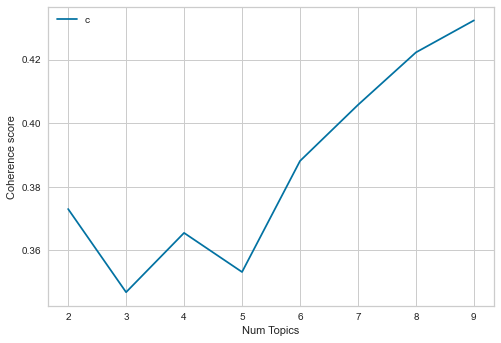

Num Topics = 2  has Coherence Value of 0.373
Num Topics = 3  has Coherence Value of 0.3468
Num Topics = 4  has Coherence Value of 0.3655
Num Topics = 5  has Coherence Value of 0.3532
Num Topics = 6  has Coherence Value of 0.3881
Num Topics = 7  has Coherence Value of 0.4057
Num Topics = 8  has Coherence Value of 0.4222
Num Topics = 9  has Coherence Value of 0.4323


In [117]:
# Calculer les scores de cohérence entre 2 et 10 topics
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=2, limit=10, step=1)

# Afficher un graphique
limit=10
start=2
step=1
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

# Afficher les coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))  #le 4 correspond au nombre de décimales du c

Let's create a function

In [118]:
def choose_topics_lda(id2word, corpus, texts):
    # Calculer les scores de cohérence entre 2 et 10 topics (Cela peut prendre un certain temps)
    model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=2, limit=10, step=1)

    # Afficher un graphique
    limit=10
    start=2
    step=1
    x = range(start, limit, step)
    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()

    # Affchier les coherence scores
    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))  #le 4 correspond au nombre de décimales du c

We test 3, 4 or 5 topics. 6 and 7 topics seem a bit important; the topics might be too close to each other.

Let's create a function to perform an LDA.

In [119]:
# model_lda(corpus, id2word, num_topics, alpha, 10)
def model_lda(corpus, id2word, num_topics, alpha, passes):
    # Build LDA model
    lda_model = LdaModel(corpus=corpus,
                                            id2word=id2word,
                                            num_topics=num_topics, 
                                            random_state=100,
                                            update_every=1,
                                            chunksize=100,
                                            passes=passes,
                                            alpha='auto',
                                            iterations=100,
                                            per_word_topics=True)
    print(lda_model.print_topics())
    return lda_model

Let's create a function to compute the metrics: model perplexity and consistency score.

In [120]:
#compute_results(lda_model, corpus, reviews["words_token_lem"], id2word, 'c_v')
def compute_results(lda_model, corpus, texts, id2word, coherence):
    # Compute Perplexity
    perplexity = lda_model.log_perplexity(corpus)
    print('\nPerplexity: ', perplexity)  # a measure of how good the model is. lower the better.

    # Compute Coherence Score
    coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence=coherence)
    coherence_lda = coherence_model_lda.get_coherence()
    print('\nCoherence Score: ', coherence_lda)
    return perplexity, coherence_lda


In [121]:
n_topics = [3, 4, 5]

In [122]:
resultat_lda = []

Let's create a function to run the LDA with different parameters.

In [123]:
def launch_model(corpus, texts, id2word, passes, coherence, n_topics, resultat_lda):
    for topic in n_topics:
        lda_model = model_lda(corpus, id2word, topic, 'auto', passes)
        perplexity, coherence_lda = compute_results(lda_model, corpus, texts, id2word, coherence)
        resultat_lda.append({ 'topic':topic, 'perplexity': perplexity, 'coherence_lda': coherence_lda })    

Let's run our function.

In [124]:
launch_model(corpus, reviews_json["words_token_lem"], id2word, 10, 'c_v', n_topics, resultat_lda)

[(0, '0.017*"subaru" + 0.008*"dealerships" + 0.008*"america" + 0.008*"dealership" + 0.007*"credit" + 0.007*"cash" + 0.006*"card" + 0.006*"hotel" + 0.006*"condones" + 0.006*"lottery"'), (1, '0.043*"food" + 0.012*"chicken" + 0.009*"salty" + 0.008*"pizza" + 0.008*"bread" + 0.007*"price" + 0.006*"place" + 0.006*"meat" + 0.006*"rice" + 0.006*"taste"'), (2, '0.031*"service" + 0.023*"food" + 0.022*"place" + 0.020*"time" + 0.013*"people" + 0.010*"customer" + 0.010*"experience" + 0.009*"minutes" + 0.009*"car" + 0.008*"manager"')]

Perplexity:  -7.638221314562013

Coherence Score:  0.3636831884512368
[(0, '0.014*"water" + 0.013*"house" + 0.012*"pizza" + 0.010*"line" + 0.008*"behavior" + 0.008*"dealerships" + 0.008*"america" + 0.007*"morning" + 0.007*"credit" + 0.007*"tables"'), (1, '0.022*"get" + 0.015*"drinks" + 0.012*"price" + 0.011*"meat" + 0.010*"soup" + 0.010*"try" + 0.008*"nails" + 0.008*"block" + 0.007*"attention" + 0.007*"carrot"'), (2, '0.040*"service" + 0.018*"time" + 0.018*"people" + 

In [125]:
df_result_lda = pd.DataFrame(resultat_lda)

In [126]:
df_result_lda

,topic,perplexity,coherence_lda
0,3,-7.638221,0.363683
1,4,-7.736623,0.423465
2,5,-7.803675,0.422683


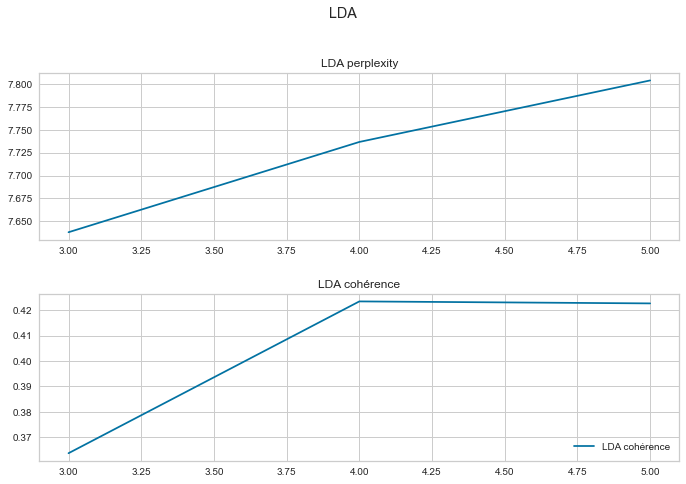

In [127]:
fig, axs = plt.subplots(2,  figsize=(10,7))
fig.suptitle('LDA')
epochs_range = df_result_lda["topic"] # epochs
perplexity = abs( df_result_lda['perplexity'])
axs[0].plot(epochs_range, perplexity, label='LDA perplexity')
axs[0].set_title('LDA perplexity')
coherence_lda = df_result_lda['coherence_lda']
axs[1].plot(epochs_range, coherence_lda, label='LDA cohérence')
axs[1].set_title('LDA cohérence')
fig.tight_layout(pad=2.0)
plt.legend(loc='lower right')


We decide to keep 4 topics which is a compromise between perplexity and consistency. The coherence is a bit weak, but it is still decent.

In [128]:
lda_model = model_lda(corpus, id2word, 4, 'auto', 10)

[(0, '0.014*"water" + 0.013*"house" + 0.012*"pizza" + 0.010*"line" + 0.008*"behavior" + 0.008*"dealerships" + 0.008*"america" + 0.007*"morning" + 0.007*"credit" + 0.007*"tables"'), (1, '0.022*"get" + 0.015*"drinks" + 0.012*"price" + 0.011*"meat" + 0.010*"soup" + 0.010*"try" + 0.008*"nails" + 0.008*"block" + 0.007*"attention" + 0.007*"carrot"'), (2, '0.040*"service" + 0.018*"time" + 0.018*"people" + 0.014*"customer" + 0.012*"car" + 0.011*"manager" + 0.011*"minutes" + 0.011*"phone" + 0.010*"experience" + 0.010*"way"'), (3, '0.090*"food" + 0.039*"place" + 0.017*"order" + 0.017*"time" + 0.015*"restaurant" + 0.011*"chicken" + 0.009*"bar" + 0.008*"salty" + 0.007*"quality" + 0.007*"times"')]


#### Dominant topic and its percentage contribution in each document

Let us now analyze the different topics obtained.

In [129]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=texts)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\2008037787.py:15: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\2008037787.py:15: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2,0.6009,"service, time, people, customer, car, manager,...","[customer, service, car, price, wash, midsize,..."
1,1,2,0.6653,"service, time, people, customer, car, manager,...","[place, beer, sub, par, food, somehow, tab, ha..."
2,2,2,0.9233,"service, time, people, customer, car, manager,...","[place, owner, time, everything, company, use,..."
3,3,2,0.6623,"service, time, people, customer, car, manager,...","[food, okay, nothing, service, reason, rating,..."
4,4,3,0.7478,"food, place, order, time, restaurant, chicken,...","[service, time, package, behnd, counter, rent,..."
5,5,2,0.5783,"service, time, people, customer, car, manager,...","[pizza, hours, mushrooms, onions, sausage, kno..."
6,6,3,0.5276,"food, place, order, time, restaurant, chicken,...","[rides, see, animals, locker, system, rides, s..."
7,7,2,0.7430,"service, time, people, customer, car, manager,...","[place, rude, reason, racist]"
8,8,1,0.4949,"get, drinks, price, meat, soup, try, nails, bl...","[lawn, july, lawn, servicing, treat, grubs, is..."
9,9,2,0.6158,"service, time, people, customer, car, manager,...","[service, food, hummus, hummus]"


In [130]:
# df_dominant_topic=df_dominant_topic.loc[df_dominant_topic['Dominant_Topic'] == 2]
# # df_dominant_topic.filter('Dominant_Topic' == 2)
df_dominant_topic.head(2)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2,0.6009,"service, time, people, customer, car, manager,...","[customer, service, car, price, wash, midsize,..."
1,1,2,0.6653,"service, time, people, customer, car, manager,...","[place, beer, sub, par, food, somehow, tab, ha..."


In [131]:
df_topic_sents_keywords.head(2)

,Dominant_Topic,Perc_Contribution,Topic_Keywords,words_token_lem
0,2,0.6009,"service, time, people, customer, car, manager,...","[customer, service, car, price, wash, midsize,..."
1,2,0.6653,"service, time, people, customer, car, manager,...","[place, beer, sub, par, food, somehow, tab, ha..."


#### The most representative sentence for each topic

Let's try to get samples of sentences that most represent a given topic. 

In [132]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10) 

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0,0.8369,"water, house, pizza, line, behavior, dealerships, america, morning, credit, tables","[switch, scam, rate, rate, months, rate, aep, kh, kh, switch, back, month, months, rate, cost, b..."
1,1,0.8811,"get, drinks, price, meat, soup, try, nails, block, attention, carrot","[workmanship, terriblei, counters, measurements, corners, joints, color, quartz, area, backsplas..."
2,2,0.9914,"service, time, people, customer, car, manager, minutes, phone, experience, way","[r, review, yelp, account, review, service, let, service, yell, review, employee, intent, employ..."
3,3,0.8753,"food, place, order, time, restaurant, chicken, bar, salty, quality, times","[meals, reviews, reviewers, reviews, service, food, macaroni, cheese, wheat, pasta, texture, sau..."


#### Word Clouds of Top N Keywords in Each Topic

A word cloud with the size of the words proportional to the weight is a pleasant sight. 

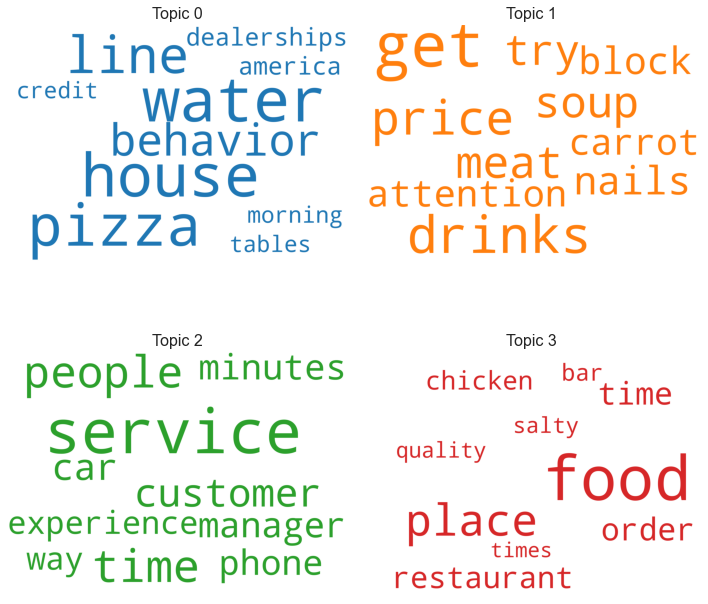

In [133]:
# 1. Wordcloud of Top N words in each topic

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=450)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

Here is the description of the topics: 
- Topic 0 appear to be "others".
- Topic 1 seems to be hygiene.
- Topic 2 is customer experience.
- Topic 3 appears to be food.

Let's look at the most present words by topic

#### Word Counts of Topic Keywords

When it comes to the keywords in the topics, the importance (weights) of the keywords matters. Along with that, how frequently the words have appeared in the documents is also interesting to look.

Let’s plot the word counts and the weights of each keyword in the same chart.
You want to keep an eye out on the words that occur in multiple topics and the ones whose relative frequency is more than the weight. Often such words turn out to be less important. The chart I’ve drawn below is a result of adding several such words to the stop words list in the beginning and re-running the training process.

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\6549197.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\6549197.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\6549197.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\ezequ\AppData\Local\Temp\ipykernel_36964\6549197.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator



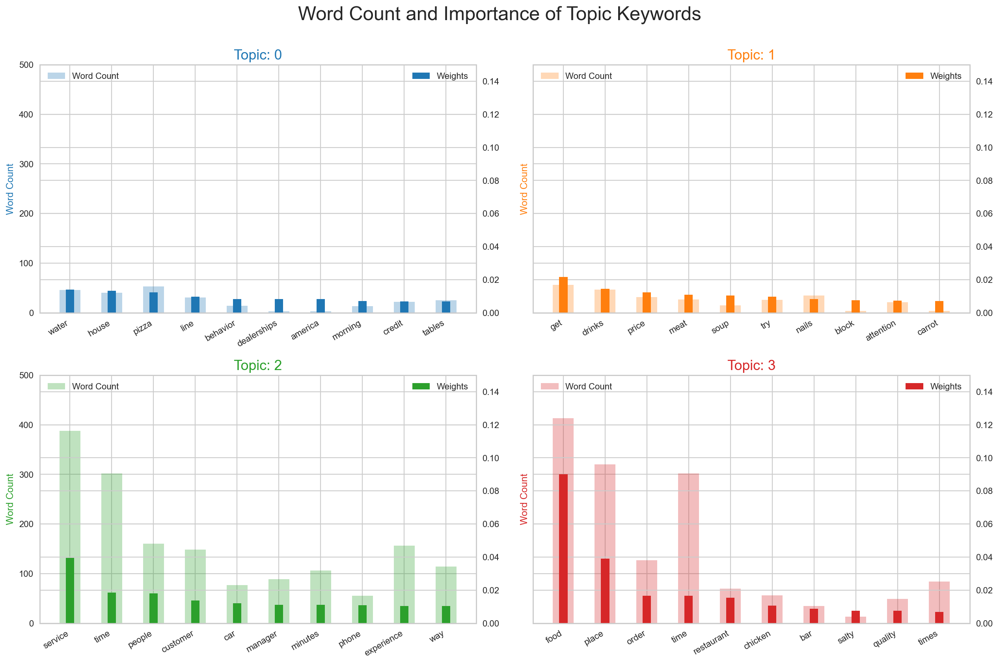

In [134]:

topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in texts for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.15); ax.set_ylim(0, 500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

We confirm what we have seen with the previous graph. However, we observe that the topic 0 and 1 seems to be quite close, because we find the topic "service".
However, some comments can be the combination of several dissatisfaction topics. 
Therefore, for the topic, if a customer is dissatisfied with the menu, he can also be dissatisfied with the service and have a bad experience.
A customer with a comment ranked in topic 2 may have service and wait time as dissatisfaction topics.


#### Sentence Chart Colored by Topic

Each word in the document is representative of one of the 4 topics. Let’s color each word in the given documents by the topic id it is attributed to.
The color of the enclosing rectangle is the topic assigned to the document.

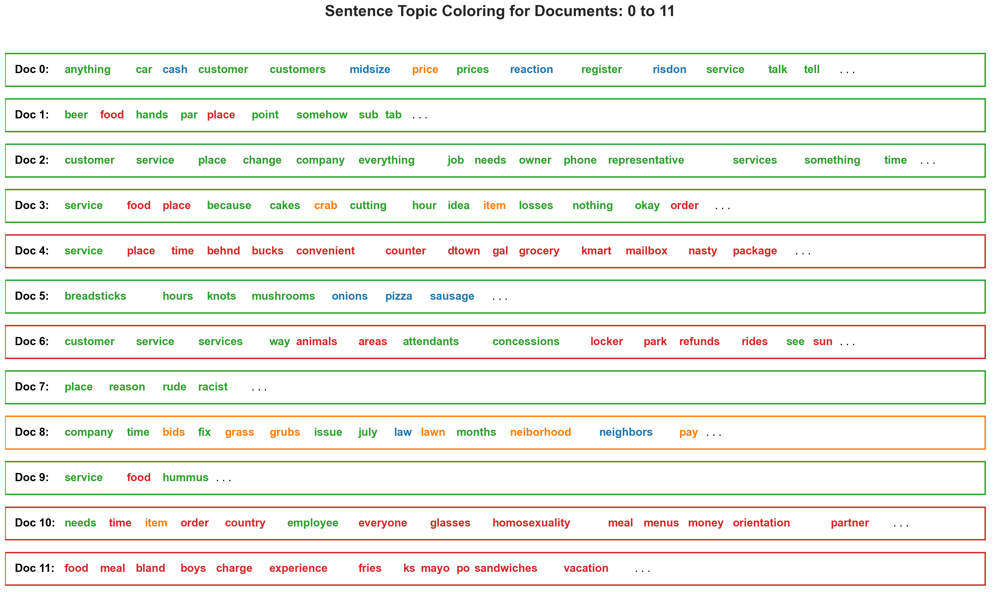

In [135]:
# Sentence Coloring of N Sentences

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()  

#### t-SNE Clustering Chart

Let’s visualize the clusters of documents in a 2D space using t-SNE (t-distributed stochastic neighbor embedding) algorithm.

In [136]:
# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1011 samples in 0.008s...
[t-SNE] Computed neighbors for 1011 samples in 0.020s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1011
[t-SNE] Computed conditional probabilities for sample 1011 / 1011
[t-SNE] Mean sigma: 0.048577
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.776241
[t-SNE] KL divergence after 1000 iterations: 0.467606


Loading BokehJS ...

#### pyLDAVis

pyLDAVis is the most commonly used and a nice way to visualise the information contained in a topic model.

In [137]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

C:\Users\ezequ\miniconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.246074 -0.119758       1        1  49.395421
3     -0.042412  0.244113       2        1  26.577343
0      0.159798 -0.100066       3        1  12.700048
1      0.128688 -0.024289       4        1  11.327188, topic_info=            Term        Freq       Total Category  logprob  loglift
18          food  407.000000  407.000000  Default  30.0000  30.0000
21         place  259.000000  259.000000  Default  29.0000  29.0000
11       service  353.000000  353.000000  Default  28.0000  28.0000
148       people  151.000000  151.000000  Default  27.0000  27.0000
49         order   75.000000   75.000000  Default  26.0000  26.0000
...          ...         ...         ...      ...      ...      ...
620    attention   14.360409   18.093979   Topic4  -4.8995   1.9469
245       number   10.604762   12.662987   Topic4  -5.2026   2.0006
214     delivery    9.564890   13.269534   Topic4  -5.3058   1.8506
1031       bread    9.541772   30.372162   Topic4  -5.3083   1.0201
134   experience    9.859613  107.909223   Topic4  -5.2755  -0.2149

[197 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
3897      3  0.973607      america
388       1  0.978541       anyone
610       1  0.977359  appointment
620       3  0.165801    attention
620       4  0.773738    attention
...     ...       ...          ...
112       1  0.988433        weeks
130       1  0.997410        woman
973       3  0.965436        women
779       4  0.961651        words
310       1  0.991830         work

[200 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 1, 2])

## Conclusion : Détection des sujets d'insatisfaction

The LDA method allows us to better detect our different themes of dissatisfaction: Hygiene, service and customer experience, food quality and the other category. Indeed, we have seen that the k-means method has difficulty separating the different themes and we find common words in the groups. We will therefore prefer the first method.

### Word Embedding
The bag of words representation that we have used until now doesn't capture the similarity between words. For that, we can use word embeddings to represent words as vectors, so that synonyms have a similar representation. Word embedding is a technique that represents words according to their context.

##### Word2Vec
Let's use the Word2Vec model to represent words as vectors.
We want to find a word that would be similar to the word "burger". Our model is not very good at finding similar words, but we can see that the word "burger" is similar to the words "meat", "chips", "taste".

In [138]:
word2vec = Word2Vec(reviews_json["words_token_lem"])
word2vec.wv.most_similar(["burger"], topn=10)

[('meat', 0.9952231645584106),
 ('months', 0.9950688481330872),
 ('people', 0.994828462600708),
 ('everyone', 0.9948024749755859),
 ('business', 0.9947985410690308),
 ('items', 0.9947956800460815),
 ('service', 0.9947916269302368),
 ('place', 0.9947489500045776),
 ('area', 0.9947177767753601),
 ('manager', 0.994673490524292)]

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



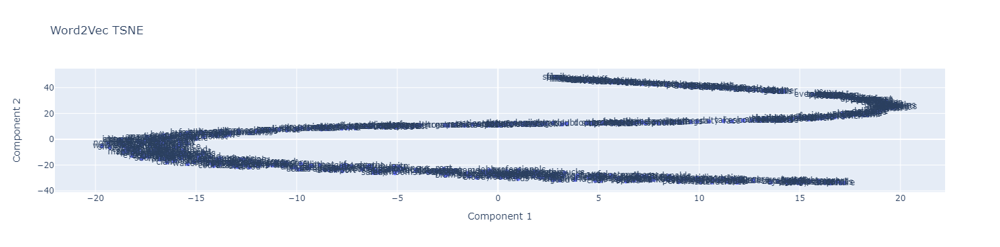

In [139]:
X_w2v = [word2vec.wv[x] for x in word2vec.wv.key_to_index.keys()]
X_tsne = TSNE(random_state=42, n_jobs=-1).fit_transform(X_w2v)

fig = px.scatter(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    text=word2vec.wv.key_to_index.keys(),
    labels={"x": "Component 1", "y": "Component 2"},
    title="Word2Vec TSNE",
)
fig.show()

If we zoom-in on a zone, we can see that similar words are close to each other.

#### FastText
Let's use the FastText model to represent words as vectors.

In [140]:
fasttext = FastText(reviews_json["words_token_lem"])
fasttext.wv.most_similar(["burger"], topn=10)

[('burgers', 0.9999864101409912),
 ('manager', 0.9999726414680481),
 ('dinner', 0.9999719858169556),
 ('water', 0.9999718070030212),
 ('chance', 0.9999715089797974),
 ('medication', 0.9999714493751526),
 ('department', 0.9999707937240601),
 ('management', 0.9999704360961914),
 ('managers', 0.9999703764915466),
 ('tastes', 0.999969482421875)]

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\ezequ\miniconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



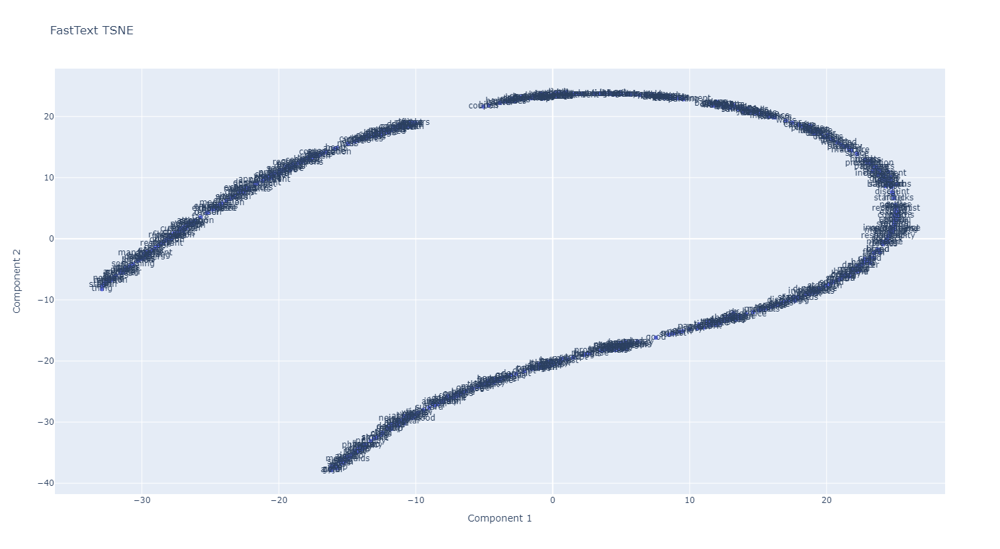

In [141]:
X_ft = [fasttext.wv[x] for x in fasttext.wv.key_to_index.keys()]
X_tsne = TSNE(random_state=42, n_jobs=-1).fit_transform(X_ft)

fig = px.scatter(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    text=fasttext.wv.key_to_index.keys(),
    labels={"x": "Component 1", "y": "Component 2"},
    title="FastText TSNE",
    width=1200, height=800
)
fig.show()

Again, if we zoom-in on a zone, we can see that similar words are close to each other.